# Вебинар 6. Консультация по курсовому проекту.

### Задание для курсового проекта

Метрика:
rmse -корень среднеквадратичного отклонения

Сдача проекта:
1. Прислать в раздел Задания Урока 10 ("Вебинар. Консультация по итоговому проекту")
ссылку на программу в github (программа должна содержаться в файле Jupyter Notebook 
с расширением ipynb). (Pull request не нужен, только ссылка ведущая на сам скрипт).
2. Приложить файл с названием по образцу SShirkin_predictions.csv
с предсказанными ценами для квартир из test.csv (файл должен содержать два поля: Id, Price).
В файле с предсказаниями должна быть 5001 строка (шапка + 5000 предсказаний).

Сроки и условия сдачи:
Для успешной сдачи должны быть все предсказания (для 5000 квартир) и R2 должен быть больше 0.6.
При сдаче до дедлайна результат проекта может попасть в топ лучших результатов.
Повторная сдача и проверка результатов возможны только при условии предыдущей неуспешной сдачи.
Успешный проект нельзя пересдать в целях повышения результата.
Проекты, сданные после дедлайна или сданные повторно, не попадают в топ лучших результатов, но можно узнать результат.
В качестве итогового результата берется первый успешный результат, последующие успешные результаты не учитываются.

Примечание:
Все файлы csv должны содержать названия полей (header - то есть "шапку"),
разделитель - запятая. В файлах не должны содержаться индексы из датафрейма.

Рекомендации для файла с кодом (ipynb):
1. Файл должен содержать заголовки и комментарии
2. Повторяющиеся операции лучше оформлять в виде функций
3. Не делать вывод большого количества строк таблиц (5-10 достаточно)
4. По возможности добавлять графики, описывающие данные (около 3-5)
5. Добавлять только лучшую модель, то есть не включать в код все варианты решения проекта
6. Скрипт проекта должен отрабатывать от начала и до конца (от загрузки данных до выгрузки предсказаний)
7. Весь проект должен быть в одном скрипте (файл ipynb).
8. При использовании статистик (среднее, медиана и т.д.) в качестве признаков,
лучше считать их на трейне, и потом на валидационных и тестовых данных не считать 
статистики заново, а брать их с трейна. Если хватает знаний, можно использовать кросс-валидацию,
но для сдачи этого проекта достаточно разбить данные из train.csv на train и valid.
9. Проект должен полностью отрабатывать за разумное время (не больше 10 минут),
поэтому в финальный вариант лучше не включать GridSearch с перебором 
большого количества сочетаний параметров.
10. Допускается применение библиотек Python и моделей машинного обучения,
которые были в курсе Python для Data Science. Градиентный бустинг изучается
в последующих курсах, поэтому в этом проекте его применять не следует.
Самая сложная из допустимых моделей - RandomForestRegressor из sklearn.


https://www.kaggle.com/competitions/real-estate-price-prediction-moscow/data


**Построение модели регрессии**
1. Обзор обучающего датасета
2. Обработка выбросов
3. Обработка пропусков
4. Анализ данных
5. Отбор признаков
6. Подбор моделей, получение бейзлана
7. Проверка качества, борьба с переобучением
8. Интерпретация результатов

**Прогнозирование на тестовом датасете**
1. Выполнить для тестового датасета те же этапы обработки и построения признаков
2. Спрогнозировать целевую переменную, используя модель, построенную на обучающем датасете
3. Прогнозы должны быть для всех примеров из тестового датасета (для всех строк)
4. Соблюдать исходный порядок примеров из тестового датасета

## Подготовка: анализ данных и идеи по их обработке и обогащению
**Подключение библиотек и скриптов, настройка среды для анализа данных**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random

from scipy.stats import norm
from scipy import stats

from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

import warnings
warnings.filterwarnings('ignore')

%config InlineBackend.figure_format = 'svg'
%matplotlib inline

**Пути к директориям и файлам**

In [2]:
TRAIN_DATASET_PATH = 'data/train.csv'
TEST_DATASET_PATH = 'data/test.csv'

### Загрузка данных

**Описание датасета**

* **Id** - идентификационный номер квартиры
* **DistrictId** - идентификационный номер района
* **Rooms** - количество комнат
* **Square** - площадь
* **LifeSquare** - жилая площадь
* **KitchenSquare** - площадь кухни
* **Floor** - этаж
* **HouseFloor** - количество этажей в доме
* **HouseYear** - год постройки дома
* **Ecology_1, Ecology_2, Ecology_3** - экологические показатели местности
* **Social_1, Social_2, Social_3** - социальные показатели местности
* **Healthcare_1, Helthcare_2** - показатели местности, связанные с охраной здоровья
* **Shops_1, Shops_2** - показатели, связанные с наличием магазинов, торговых центров
* **Price** - цена квартиры

In [3]:
train = pd.read_csv(TRAIN_DATASET_PATH)
test = pd.read_csv(TEST_DATASET_PATH)

## Анализ исходного набора данных

In [4]:
def tune_mem_usage(df):

    df['Rooms'] = df['Rooms'].astype('int64')
    df['HouseFloor'] = df['HouseFloor'].astype('int64')    

    for c in df.columns:
        # Все int в integer и unsigned, если нет отрицательных значений
        if df[c].dtypes.kind == 'i' or df[c].dtypes.kind == 'u':
            if df[c].min() >= 0:
                df[c] = pd.to_numeric(df[c], downcast='unsigned')
            else:
                df[c] = pd.to_numeric(df[c], downcast='integer')
        # Все сложные плавающие точки -  в foat
        elif df[c].dtypes.kind == 'f' or df[c].dtypes.kind == 'c':
            df[c] = pd.to_numeric(df[c], downcast='float')

        # Все объекты - в категориальные, если количество уникальных значений меньше половины всех значений
        elif df[c].dtypes.kind == 'O':
            num_unique_values = len(df[c].unique())
            num_total_values = len(df[c])
            if num_unique_values / num_total_values < 0.5:
                df[c] = df[c].astype('category')
    return df

def reset_fd(drop_target=False, train_only=False, test_only=False):
        # грузим
        train = pd.read_csv(TRAIN_DATASET_PATH)
        test = pd.read_csv(TEST_DATASET_PATH)
        train.drop('Id', axis=1, inplace=True)
        test.drop('Id', axis=1, inplace=True)

        # Оптимизируем память
        
        train = tune_mem_usage(train)
        test = tune_mem_usage(test)

        if train_only:
            return train
        if test_only:
            return test
    
        # Строим общий dataset без целевой переменной price
        fd = pd.concat((train, test), sort=False).reset_index(drop=True)
    
        if drop_target:
            fd.drop(['Price'], axis=1, inplace=True)
        
        return fd

In [5]:
fd = reset_fd()

### Посмотрим на описание данных

In [6]:
fd.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
DistrictId,15000.0,50.693600,43.786257,0.000000,20.000000,37.000000,75.000000,2.120000e+02
Rooms,15000.0,1.897000,0.839229,0.000000,1.000000,2.000000,2.000000,1.900000e+01
Square,15000.0,56.360554,20.423906,1.136859,41.814370,52.645758,66.036606,6.410652e+02
LifeSquare,11846.0,36.851757,71.120193,0.333490,22.896130,32.822811,45.144627,7.480592e+03
KitchenSquare,15000.0,6.174467,24.017342,0.000000,1.000000,6.000000,9.000000,2.014000e+03
Floor,15000.0,8.561800,5.323113,1.000000,4.000000,7.000000,12.000000,7.800000e+01
HouseFloor,15000.0,12.606600,6.780165,0.000000,9.000000,12.000000,17.000000,1.170000e+02
HouseYear,15000.0,3321.575067,163707.780381,1908.000000,1974.000000,1977.000000,2001.000000,2.005201e+07
Ecology_1,15000.0,0.119195,0.119371,0.000000,0.017647,0.075424,0.195781,5.218670e-01
Social_1,15000.0,24.769267,17.532278,0.000000,6.000000,25.000000,36.000000,7.400000e+01


In [7]:
fd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   DistrictId     15000 non-null  uint8   
 1   Rooms          15000 non-null  uint8   
 2   Square         15000 non-null  float32 
 3   LifeSquare     11846 non-null  float32 
 4   KitchenSquare  15000 non-null  float32 
 5   Floor          15000 non-null  uint8   
 6   HouseFloor     15000 non-null  uint8   
 7   HouseYear      15000 non-null  uint32  
 8   Ecology_1      15000 non-null  float32 
 9   Ecology_2      15000 non-null  category
 10  Ecology_3      15000 non-null  category
 11  Social_1       15000 non-null  uint8   
 12  Social_2       15000 non-null  uint16  
 13  Social_3       15000 non-null  uint8   
 14  Healthcare_1   7825 non-null   float32 
 15  Helthcare_2    15000 non-null  uint8   
 16  Shops_1        15000 non-null  uint8   
 17  Shops_2        15000 non-null  

In [8]:
fd['Rooms'].value_counts()

2     5910
1     5474
3     3334
4      240
5       25
0       10
6        3
10       2
19       1
17       1
Name: Rooms, dtype: int64

In [9]:
fd.loc[fd['HouseYear'] > 2022, 'HouseYear']

8828        4968
9163    20052011
Name: HouseYear, dtype: uint32

Очевидно, что необходимо оптимизмровать атрибуты: 
<ul>
    <li><b>Rooms</b>, где min 0, max 19</li>
    <li><b>Square</b>, где где min 1.1, max 641</li>
    <li><b>HouseFloor</b>, где min 0, а также <b>Floor</b></li>
    <li><b>LifeSquare</b>, где есть пустые и необычно малые или нулевые значения</li>
    <li><b>Healthcare_1</b>, где есть пустые значения</li>
    <li><b>KitchenSquare</b>, где есть необычно малые или нулевые значения</li>
    <li><b>HouseYear</b>, где max 2.005201e+07</li>
    <li>Соотношение <b>Square</b>, <b>LifeSquare</b>, <b>KitchenSquare</b>
</ul>


Посмотрим, какие аттрибуты сильнее всего коррелируют с **Price** в train:

In [10]:
train = fd.loc[fd['Price'].notna()]

<AxesSubplot:>

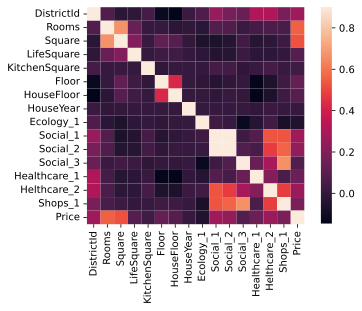

In [11]:
corrmat = train.loc[:, train.columns != 'Id'].corr()
sns.heatmap(corrmat, vmax=0.9, square=True)

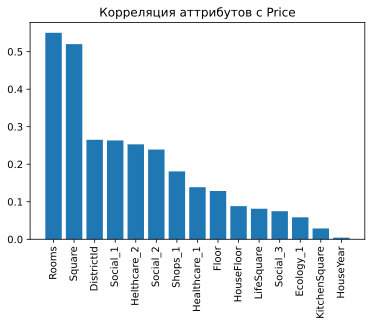

In [12]:
corrmat = train.loc[:, train.columns != 'Id'].corrwith(
    train['Price']).abs().sort_values(ascending=False)[1:]
plt.bar(corrmat.index, corrmat.values)
plt.title('Корреляция аттрибутов с Price')
plt.xticks(rotation='vertical')
plt.show()

Уберем выбросы в **Rooms** - это значения 0 и несоразмерные общей площади (>4 при Square<40). 

Однако, вначале надо исправить HouseYear, HouseFloor, Floor, Square, LifeSquare и KitchenSquare:

In [13]:
def fix_HouseYear(d):
    # Исправим опечатки в HouseYear
    d.loc[d['HouseYear'] == 20052011, 'HouseYear'] = 2008
    d.loc[d['HouseYear'] == 4968, 'HouseYear'] = 1968
    return d

In [14]:
fd = fix_HouseYear(fd)
fd['HouseYear'].describe()

count    15000.000000
mean      1984.708200
std         18.466515
min       1908.000000
25%       1974.000000
50%       1977.000000
75%       2001.000000
max       2020.000000
Name: HouseYear, dtype: float64

Поправим этажность слишком высоких домов:

Примем типичную этажность домов в Москве: 
< 1968 = 5, 
1968 - 1980 = 9, 
1981 - 1984 = 12, 
1985 - 2002 = 17
2002 - now = 20

In [15]:
# фиксим HouseFloor
def max_floor(year):

    if year < 1968:
        return 5
    elif year < 1980:
        return 9
    elif year < 1984:
        return 12
    elif year < 2002:
        return 17
    else: 
        return 20

def fix_HouseFloor(fd):
    fd.loc[((fd['HouseFloor']>5)&(fd['HouseYear']<1906))| \
        ((fd['HouseFloor']>8)&(fd['HouseYear']<1913))| \
        ((fd['HouseFloor']>10)&(fd['HouseYear']<1932))| \
        ((fd['HouseFloor']>12)&(fd['HouseYear']<1953))| \
        ((fd['HouseFloor']>32)&(fd['HouseYear']<2004))| \
        ((fd['HouseFloor']>58)&(fd['HouseYear']<2008))| \
        ((fd['HouseFloor']>75)&(fd['HouseYear']<2013))| \
        (fd['HouseFloor']>95)|(fd['HouseFloor']==0), 'HouseFloor'] = \
    fd.loc[((fd['HouseFloor']>5)&(fd['HouseYear']<1906))| \
        ((fd['HouseFloor']>8)&(fd['HouseYear']<1913))| \
        ((fd['HouseFloor']>10)&(fd['HouseYear']<1932))| \
        ((fd['HouseFloor']>12)&(fd['HouseYear']<1953))| \
        ((fd['HouseFloor']>32)&(fd['HouseYear']<2004))| \
        ((fd['HouseFloor']>58)&(fd['HouseYear']<2008))| \
        ((fd['HouseFloor']>75)&(fd['HouseYear']<2013))| \
        (fd['HouseFloor']>95)|(fd['HouseFloor']==0), 'HouseYear'].apply(lambda x: max_floor(x))
    return fd

In [16]:
fd = fix_HouseFloor(fd)

In [17]:
# фиксим Floor, когда он больше HouseFloor
def fix_Floor(fd):
    fd.loc[fd['Floor']>fd['HouseFloor'], 'Floor'] = fd.loc[fd['Floor']>fd['HouseFloor'], 'HouseFloor'] - 1
    return fd

In [18]:
fd = fix_Floor(fd)

In [19]:
def fix_Rooms_init(fd):
    
    # Исправляем Rooms > 3 and Suqare < 50 на 2
    fd.loc[(fd['Rooms']>3) & (fd['Square']<50), 'Rooms'] = 2
    
    # Где 0, заполним 1
    fd.loc[fd['Rooms'] == 0, 'Rooms'] = 1
   
    return fd

In [20]:
fd = fix_Rooms_init(fd)

In [21]:
def fix_Square(d):
    # Уберем выбросы Square, которые отличаются на порядок и выглядят как опечатки
    d.loc[d['Square'] > 300, 'Square'] = d.loc[d['Square'] > 300, 'Square'] / 10
    d.loc[d['Square'] < 10, 'NewSquare'] = d.loc[d['Square'] < 10, 'Square'] * 10
    d.loc[d['Square'] < 10, 'LifeSquare'] = d.loc[d['Square'] < 10, 'LifeSquare'] * 10
    d.loc[d['Square'] < 10, 'Square'] = d.loc[d['Square'] < 10, 'NewSquare']
    
    # Удалим NewSquare
    d.drop('NewSquare', axis=1, inplace=True)
    return d

In [22]:
fd = fix_Square(fd)

Идеи по фиксингу LifeSquare и KitchenSquare:
    <li>посчитать среднюю площадь кухни по разумным данным в разрезе года, этажности и комнат
    <li>посчитать среднюю жилую площадь (ratio LS / S) по разумным данным в разрезе года, этажности и комнат
    <li>тот же подход можно применить к общей площади
    
По этажности:
    <li>определить выбросы больше стат данных по высотности
    <li>найти моду по этажности домов по периодам времени
    
Проанализировать влияние DistrictId на цену по срезу одинаковой площади, года и комнат
Найти самые дорогие DistrictId

In [23]:
fd.loc[fd['KitchenSquare']>1000]
# стоит год постройки - обнулимм

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
6505,81,1,32.276665,19.278395,1970.0,0,1,1977,0.006076,B,B,30,5285,0,645.0,6,6,B,105539.554688
9520,62,1,47.100719,46.447960,2014.0,0,1,2014,0.072158,B,B,2,629,1,NaN,0,0,A,108337.484375


In [24]:
fd.loc[fd['KitchenSquare']>fd['Square']*0.4].head()
# явно ошибка в порядке - разделим на 10

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
286,27,3,123.430069,125.806984,123.0,5,10,2015,0.017647,B,B,2,469,0,NaN,0,0,B,234194.843750
456,62,1,46.013187,43.417042,43.0,4,17,2019,0.072158,B,B,2,629,1,NaN,0,0,A,113909.101562
682,52,2,64.859245,NaN,62.0,15,17,1977,0.371149,B,B,34,7065,1,750.0,2,5,B,185993.468750
755,10,1,35.813564,19.953993,35.0,6,14,1971,0.282798,B,B,33,8667,2,NaN,0,6,B,164306.312500
1728,2,3,79.722244,44.731220,72.0,12,16,1987,0.130618,B,B,39,10418,9,900.0,1,9,B,370148.625000


In [25]:
def fix_KitchenSquare(fd):
    
    # Там, где > 1000 стоит год постройки - обнуляем
    fd.loc[fd['KitchenSquare']>1000, 'KitchenSquare'] = 0
    
    # Исправляем ошибку в порядке значения
    fd.loc[fd['KitchenSquare']>fd['Square']*0.4, 'KitchenSquare'] = \
    fd.loc[fd['KitchenSquare']>fd['Square']*0.4, 'KitchenSquare'] / 10
    # Второй раз для ошибок на два порядка
    fd.loc[fd['KitchenSquare']>fd['Square']*0.4, 'KitchenSquare'] = \
    fd.loc[fd['KitchenSquare']>fd['Square']*0.4, 'KitchenSquare'] / 10
 
    # Считаем среднее отношение KitchenSquare к Square в квартирах с нормальной KitchenSquare
    fd.loc[~(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'KS_2_S'] = \
    (fd.loc[~(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'KitchenSquare'] / \
    fd.loc[~(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'Square']).astype('float')

    # Рассчитаем среднее значение KS_2_S по году постройки, этажности и количеству комнат в доме
    tmp_KSR = fd.groupby(['HouseFloor', 'HouseYear', 'Rooms'], as_index=False).\
    agg({'KS_2_S': 'mean'}).rename(columns={'KS_2_S': 'mean_Ks2S'})
    
    # добавим mean_Ks2S в исходный набор
    fd = pd.merge(fd, tmp_KSR, on=['HouseFloor', 'HouseYear', 'Rooms'], how='left')
    
    # Заполним mean_Ks2S общей медианой там, где значения по годам, этажности и комнатам не рассчитались
    general_mean_Ks2S = fd['mean_Ks2S'].median()
    fd.loc[fd['mean_Ks2S'].isnull(), 'mean_Ks2S'] = general_mean_Ks2S
    
    # Рассчитаем fixedKS для квартир с аномально низкой KitchenSquare
    fd.loc[(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'KitchenSquare'] = \
    fd.loc[(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'Square'] * \
    fd.loc[(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'mean_Ks2S']

    # удалим временные столбцы
    fd.drop(['KS_2_S', 'mean_Ks2S'], axis=1, inplace=True)
    
    return fd

In [26]:
fd = fix_KitchenSquare(fd)

In [27]:
def fix_LifeSquare(fd):

    # Сделаем пустыми "кривые" LifeSquare
    fd.loc[(fd['Square'] < fd['LifeSquare'])|(fd['LifeSquare']<fd['Square']*0.2), 'LifeSquare'] = np.NaN
    
    # Заполним пропуски LifeSquare умножением Square на расчетное значение среднего отношения общей к жилой
    # Для этого рассчитаем среднее отношение жилой к общей площади по году, району и этажности дома
    fd.loc[(fd['Square']>fd['LifeSquare'])&(fd['LifeSquare'].notna()), 'LS_2_S'] = \
    fd.loc[(fd['Square']>fd['LifeSquare'])&(fd['LifeSquare'].notna()), 'LifeSquare'] / \
    fd.loc[(fd['Square']>fd['LifeSquare'])&(fd['LifeSquare'].notna()), 'Square']

    tmp = fd.groupby(['HouseFloor', 'HouseYear', 'DistrictId'], as_index=False).\
    agg({'LS_2_S': 'mean'}).rename(columns={'LS_2_S': 'mean_ls2s'})

    # добавим mean_ls2s в исходный dataset
    fd = pd.merge(fd, tmp, on=['HouseFloor', 'HouseYear', 'DistrictId'], how='left')
    fd['mean_ls2s'] = fd['mean_ls2s'].fillna(fd['mean_ls2s'].mean())

    # Заполним пустые LifeSquare расчетной величиной
    fd.loc[fd['LifeSquare'].isnull(), 'LifeSquare'] = fd.loc[fd['LifeSquare'].isnull(), 'Square'] * \
    fd.loc[fd['LifeSquare'].isnull(), 'mean_ls2s']

    # Удаляем временные столбцы LS_2_S и mean_ls2s
    fd.drop('LS_2_S', axis=1, inplace=True)
    fd.drop('mean_ls2s', axis=1, inplace=True)
  
    return fd

In [28]:
fd = fix_LifeSquare(fd)

In [29]:
def fix_rooms(fd):

    # рассчитаем среднюю площадь по району и году постройки в расчете на одну комнату
    rls_by_dy = fd.groupby(['DistrictId', 'HouseYear'], as_index=False).agg({'Rooms': 'sum', 'LifeSquare': 'sum'}).rename(columns={'Rooms': 'sum_rooms', 'LifeSquare': 'sum_ls'})
    rls_by_dy['avg_ls_per_room'] = rls_by_dy['sum_ls'] / rls_by_dy['sum_rooms']

    # Заменим значения mean_s_per_room равные infinite средней расчетной величиной по всем данным
    mean_lspr = rls_by_dy.loc[rls_by_dy['avg_ls_per_room']!=np.inf, 'avg_ls_per_room'].mean()
    rls_by_dy.loc[rls_by_dy['avg_ls_per_room']==np.inf, 'avg_ls_per_room'] = mean_lspr

    # уберем вспомогательные переменные
    rls_by_dy.drop(['sum_ls', 'sum_rooms'], axis=1, inplace=True)

    # добавим среднюю жилую площадь на комнату в исходный dataset
    fd = pd.merge(fd, rls_by_dy, on=['DistrictId', 'HouseYear'], how='left')
        
    # Там, где комнат больше 6 пересчитаем количество комнат как жилую площадь на среднюю жилую площадь комнаты
    fd.loc[fd['Rooms'] > 6, 'Rooms'] = (fd.loc[fd['Rooms'] > 6, 'LifeSquare']
                                        // fd.loc[fd['Rooms'] > 6, 'avg_ls_per_room']).astype('uint8')

    # Аналогично, где комнат 0
    fd.loc[fd['Rooms'] == 0, 'Rooms'] = (fd.loc[fd['Rooms'] == 0, 'LifeSquare']
                                         // fd.loc[fd['Rooms'] == 0, 'avg_ls_per_room']).astype('uint8')

    # Если остались такие, что больше 6, то пересчитаем исходя из средней площади комнаты по всем данным
    fd.loc[fd['Rooms'] > 6, 'Rooms'] = (fd.loc[fd['Rooms'] > 6, 'LifeSquare'] // mean_lspr).astype('uint8')
    
    # Исправляем Rooms > 4 and Suqare < 60
    fd.loc[(fd['Rooms']>4) & (fd['Square']<60), 'Rooms'] = (fd.loc[(fd['Rooms']>4) & (fd['Square']<60), 'Square'] // mean_lspr).astype('uint8')
    
    # Где осталось 0, заполним 1
    fd.loc[fd['Rooms'] == 0, 'Rooms'] = 1
    
    # Удаляем avg_ls_per_room
    fd.drop('avg_ls_per_room', axis=1, inplace=True)
    
    return fd

In [30]:
fd = fix_rooms(fd)

In [31]:
fd['Healthcare_1'].info()

<class 'pandas.core.series.Series'>
Int64Index: 15000 entries, 0 to 14999
Series name: Healthcare_1
Non-Null Count  Dtype  
--------------  -----  
7825 non-null   float32
dtypes: float32(1)
memory usage: 175.8 KB


Больше половины данных не содержат аттрибут <b>Healthcare_1</b>, поэтому его можно удалить

In [32]:
def drop_Healthcare_1(fd):
    return fd.drop('Healthcare_1', axis=1)

In [33]:
fd = drop_Healthcare_1(fd)

### Добавление новых признаков

In [34]:
# Этаж важен при оценке стоимости квартиры
# Добавим поле категории этажа

def floor_class(floor, house_floor):
    '''
    Группы этажности по возрастанию привлекательности для покупателя:
    
    0 - неизвестная группа: этажи, указанные некорректно по отношению к HouseFloor
    1 - первый этаж
    2 - последний этаж
    3 - со 2 по 3
    4 - выше 13 кроме последнего
    5 - с 7 по 9
    6 - с 4 по 6 и с 10 по 13
    '''
    if floor > house_floor:
        return 0
    elif floor ==1:
        return 1
    elif floor == house_floor:
        return 2
    elif floor in range(2, 4):
        return 3
    elif floor in range(7, 10):
        return 5
    elif floor in range(4, 7) or floor in range(10, 14):
        return 6
    else:
        return 4

def enrich_floor_class(fd):
    fd['Floor_Class'] = fd.apply(lambda row: floor_class(row['Floor'], row['HouseFloor']), axis=1)
    return fd

In [35]:
fd = enrich_floor_class(fd)

#### Попробуем сгруппировать по годам постройки

In [36]:
train = fd.loc[fd['Price'].notna()]
train_cluster = train.copy()

In [37]:
scaler = MinMaxScaler()

In [38]:
train_cluster_scaled = pd.DataFrame(scaler.fit_transform(train_cluster.loc[:, ['HouseYear', 'Price']]), \
                               columns=['HouseYear', 'Price'])

In [39]:
from scipy.spatial.distance import cdist
def apply_elbow_method(X):
    """Визуализация для метода 'локтя'"""
    
    distortions = []
    K = range(2,30)
    for k in K:
        kmeanModel = KMeans(n_clusters=k, random_state=33).fit(X)
        distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

    plt.figure(figsize=(10, 8))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method showing the optimal k')
    plt.show()
    
def display_clusters_distribution(unique_labels, labels_counts):
    """Визуализация распределения классов по кластерам"""
    plt.figure(figsize=(8,5))

    plt.bar(unique, counts)

    plt.xlabel('Clusters')
    plt.xticks(unique)
    plt.ylabel('Count')
    plt.title('Clusters distribution')
    plt.show()


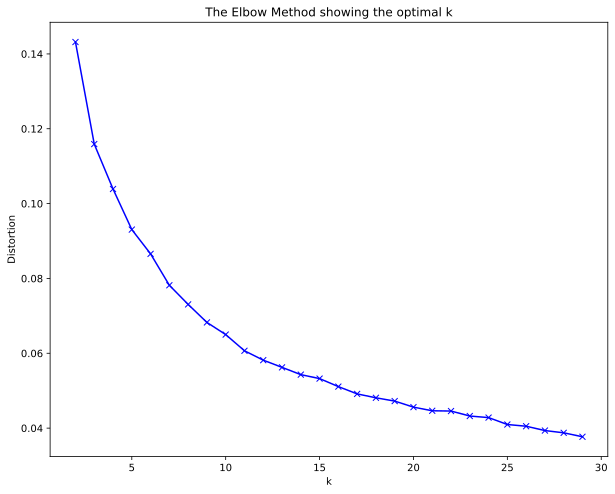

In [40]:
apply_elbow_method(train_cluster_scaled)

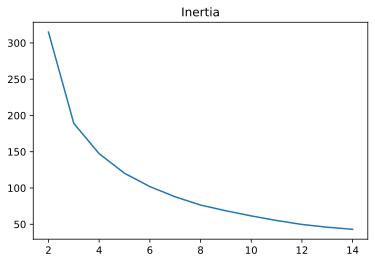

In [41]:
inertias = []

for i in range(2, 15):
    temp_model = KMeans(n_clusters=i, random_state=100)
    temp_model.fit(train_cluster_scaled)
    temp_inertia = temp_model.inertia_
    inertias.append(temp_inertia)

plt.plot(range(2, 15), inertias)
plt.title('Inertia')

plt.show()

In [42]:
agglomerative_clustering_model = AgglomerativeClustering(n_clusters=5)
train_cluster['cluster_year'] = agglomerative_clustering_model.fit_predict(train_cluster_scaled)

Text(0.5, 1.0, 'Train')

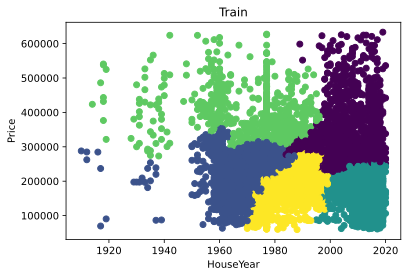

In [43]:
plt.scatter(train_cluster['HouseYear'], train_cluster['Price'], c=train_cluster['cluster_year'])
plt.xlabel('HouseYear')
plt.ylabel('Price')
plt.title('Train')

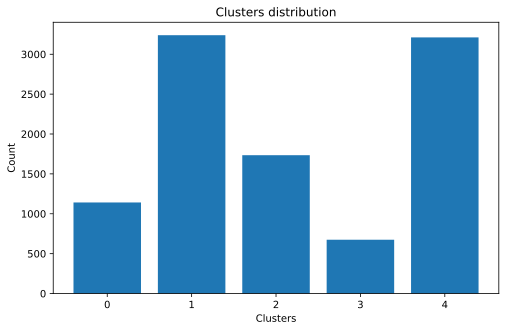

In [44]:
labels_clast = pd.Series(train_cluster['cluster_year'], name='cluster_year')

unique, counts = np.unique(labels_clast, return_counts=True)
display_clusters_distribution(unique, counts)

In [45]:
train_cluster['cluster_year'].describe()

count    10000.000000
mean         2.157300
std          1.451884
min          0.000000
25%          1.000000
50%          2.000000
75%          4.000000
max          4.000000
Name: cluster_year, dtype: float64

In [46]:
def enrich_house_year(fd):
    fd_scaled = pd.DataFrame(scaler.fit_transform(
        fd.loc[:, ['HouseYear']]), columns=['HouseYear'])
    agglomerative_clustering_model = AgglomerativeClustering(n_clusters=5)
    fd['cluster_H_Y'] = agglomerative_clustering_model.fit_predict(fd_scaled)

    '''
    labels_clast = pd.Series(fd['cluster_H_Y'], name='cluster_H_Y')
    unique, counts = np.unique(labels_clast, return_counts=True)
    display_clusters_distribution(unique, counts)
    '''
    
    return fd

In [47]:
fd = enrich_house_year(fd)

In [48]:
'''
Добавим два аттрибута: среднюю цену по количеству комнат 
и среднюю цену по количеству комнат по району.
Там, где нет данных возьмем среднюю цену по всем объектам
'''

def enrich_mean_prices(fd):
    train = fd.loc[fd['Price'].notna()]
    
    mean_price = train['Price'].mean()
    
    price_mean_by_r = train.groupby(['Rooms'], as_index=False).agg({'Price': 'mean'}).\
        rename(columns={'Price': 'mean_price_by_r'})

    price_mean_by_d_r = train.groupby(['DistrictId', 'Rooms'], as_index=False).agg({'Price': 'mean'}).\
        rename(columns={'Price': 'mean_price_by_d_r'})

    fd = pd.merge(fd, price_mean_by_d_r, on=['DistrictId', 'Rooms'], how='left')
    fd = pd.merge(fd, price_mean_by_r, on='Rooms', how='left')
    
    fd['mean_price_by_d_r'] = fd['mean_price_by_d_r'].fillna(fd['mean_price_by_r'])
    
    fd['mean_price_by_d_r'] = fd['mean_price_by_d_r'].fillna(mean_price)
    
    fd['mean_price_by_r'] = fd['mean_price_by_r'].fillna(mean_price)
    
    return fd

In [49]:
fd = enrich_mean_prices(fd)

In [50]:
fd.nlargest(10,'mean_price_by_d_r')

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,...,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2,Price,Floor_Class,cluster_H_Y,mean_price_by_d_r,mean_price_by_r
1026,95,4,99.039162,71.575836,11.000000,2,3,1942,0.000699,B,...,3369,24,0,3,B,624156.0000,3,4,624156.0000,384471.75000
940,169,5,117.855972,76.561317,9.000000,12,14,2001,0.178917,B,...,3594,4,1,5,B,608674.1250,6,1,608674.1250,441807.90625
3955,48,4,123.846931,117.799706,19.695848,0,1,2015,0.041125,B,...,9515,5,1,10,B,595128.1875,4,3,595128.1875,384471.75000
347,103,4,100.501411,59.413975,10.000000,3,14,2003,0.014423,B,...,3806,4,0,3,B,593618.7500,3,1,593618.7500,384471.75000
14025,103,4,92.499771,64.325661,7.000000,3,10,1958,0.000699,B,...,3369,24,0,3,B,NaN,3,2,593618.7500,384471.75000
5992,169,4,120.881554,73.398071,12.000000,14,17,2000,0.178917,B,...,3594,4,1,5,B,585105.2500,4,1,585105.2500,384471.75000
5017,83,4,101.459366,66.856049,9.000000,16,22,1996,0.007720,B,...,4788,2,0,4,B,593452.1875,4,1,572686.6875,384471.75000
8384,83,4,116.728951,73.217255,11.000000,15,17,1990,0.007720,B,...,4788,2,0,4,B,551921.1875,4,0,572686.6875,384471.75000
599,56,4,138.994995,95.391060,22.104902,0,1,1977,0.000000,B,...,5067,4,2,6,B,571939.9375,4,0,570525.0625,384471.75000
4862,56,4,103.320694,67.811928,10.000000,10,22,1999,0.000000,B,...,5067,4,2,6,B,569110.1875,6,1,570525.0625,384471.75000


In [51]:
# Добавим аттрибут district_size, равный количеству предложений в районе

def enrich_district_size(df):
    distr_info = df['DistrictId'].value_counts().reset_index().\
        rename(columns={"index": "DistrictId", "DistrictId": 'district_size'})
    df = pd.merge(df, distr_info, on='DistrictId', how='left')
    df['district_size'] = df['district_size'].fillna(1)
    return df

In [52]:
fd = enrich_district_size(fd)

In [53]:
fd = pd.get_dummies(fd)

In [54]:
fd.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
DistrictId,15000.0,50.693600,43.786257,0.000000,20.000000,37.000000,75.000000,212.000000
Rooms,15000.0,1.893533,0.809676,1.000000,1.000000,2.000000,2.000000,6.000000
Square,15000.0,56.304096,19.055853,11.368588,41.834642,52.649790,66.016399,275.645294
LifeSquare,15000.0,39.063881,17.123613,8.731467,26.229041,35.045786,47.587985,233.949310
KitchenSquare,15000.0,8.672217,2.858177,1.399982,6.669261,8.746963,10.000000,43.000000
Floor,15000.0,7.763067,5.231809,0.000000,4.000000,7.000000,11.000000,42.000000
HouseFloor,15000.0,12.829467,6.297118,1.000000,9.000000,13.000000,17.000000,48.000000
HouseYear,15000.0,1984.708200,18.466515,1908.000000,1974.000000,1977.000000,2001.000000,2020.000000
Ecology_1,15000.0,0.119195,0.119371,0.000000,0.017647,0.075424,0.195781,0.521867
Social_1,15000.0,24.769267,17.532278,0.000000,6.000000,25.000000,36.000000,74.000000


## Итоговый скрипт построения модели

In [55]:
# Импорт библиотек
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from scipy.stats import norm
from scipy import stats
from scipy.spatial.distance import cdist

from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LassoCV, Ridge

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import r2_score, mean_absolute_error as mae, mean_squared_error

from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

%config InlineBackend.figure_format = 'svg'
%matplotlib inline

# Пути к данным
TRAIN_DATASET_PATH = 'data/train.csv'
TEST_DATASET_PATH = 'data/test.csv'

# Загрузка данных
train = pd.read_csv(TRAIN_DATASET_PATH)
test = pd.read_csv(TEST_DATASET_PATH)

# Оптимизация памяти
def tune_mem_usage(df):

    df['Rooms'] = df['Rooms'].astype('int64')
    df['HouseFloor'] = df['HouseFloor'].astype('int64')    

    for c in df.columns:
        # Все int в integer и unsigned, если нет отрицательных значений
        if df[c].dtypes.kind == 'i' or df[c].dtypes.kind == 'u':
            if df[c].min() >= 0:
                df[c] = pd.to_numeric(df[c], downcast='unsigned')
            else:
                df[c] = pd.to_numeric(df[c], downcast='integer')
        # Все сложные плавающие точки -  в foat
        elif df[c].dtypes.kind == 'f' or df[c].dtypes.kind == 'c':
            df[c] = pd.to_numeric(df[c], downcast='float')

        # Все объекты - в категориальные, если количество уникальных значений меньше половины всех значений
        elif df[c].dtypes.kind == 'O':
            num_unique_values = len(df[c].unique())
            num_total_values = len(df[c])
            if num_unique_values / num_total_values < 0.5:
                df[c] = df[c].astype('category')
    return df

train = tune_mem_usage(train)
test = tune_mem_usage(test)
fd = pd.concat((train, test), sort=False).reset_index(drop=True)

#### Функции обработки пропусков и выбросов

In [56]:
# Обработка пропусков и выбросов

def fix_HouseYear(d):
    # Исправим опечатки в HouseYear
    d.loc[d['HouseYear'] == 20052011, 'HouseYear'] = 2008
    d.loc[d['HouseYear'] == 4968, 'HouseYear'] = 1968
    return d


def max_floor(year):
    if year < 1968:
        return 5
    elif year < 1980:
        return 9
    elif year < 1984:
        return 12
    elif year < 2002:
        return 17
    else: 
        return 20


def fix_HouseFloor(fd):
    fd.loc[((fd['HouseFloor']>5)&(fd['HouseYear']<1906))| \
        ((fd['HouseFloor']>8)&(fd['HouseYear']<1913))| \
        ((fd['HouseFloor']>10)&(fd['HouseYear']<1932))| \
        ((fd['HouseFloor']>12)&(fd['HouseYear']<1953))| \
        ((fd['HouseFloor']>32)&(fd['HouseYear']<2004))| \
        ((fd['HouseFloor']>58)&(fd['HouseYear']<2008))| \
        ((fd['HouseFloor']>75)&(fd['HouseYear']<2013))| \
        (fd['HouseFloor']>95)|(fd['HouseFloor']==0), 'HouseFloor'] = \
    fd.loc[((fd['HouseFloor']>5)&(fd['HouseYear']<1906))| \
        ((fd['HouseFloor']>8)&(fd['HouseYear']<1913))| \
        ((fd['HouseFloor']>10)&(fd['HouseYear']<1932))| \
        ((fd['HouseFloor']>12)&(fd['HouseYear']<1953))| \
        ((fd['HouseFloor']>32)&(fd['HouseYear']<2004))| \
        ((fd['HouseFloor']>58)&(fd['HouseYear']<2008))| \
        ((fd['HouseFloor']>75)&(fd['HouseYear']<2013))| \
        (fd['HouseFloor']>95)|(fd['HouseFloor']==0), 'HouseYear'].apply(lambda x: max_floor(x))
    return fd


def fix_Floor(fd):
    fd.loc[fd['Floor']>fd['HouseFloor'], 'Floor'] = fd.loc[fd['Floor']>fd['HouseFloor'], 'HouseFloor'] - 1
    return fd


def fix_Rooms_init(fd):
    # Исправляем Rooms > 3 and Suqare < 50 на 2
    fd.loc[(fd['Rooms']>3) & (fd['Square']<50), 'Rooms'] = 2

    # Где 0, заполним 1
    fd.loc[fd['Rooms'] == 0, 'Rooms'] = 1
   
    return fd


def fix_Square(d):
    # Уберем выбросы Square, которые отличаются на порядок и выглядят как опечатки
    d.loc[d['Square'] > 300, 'Square'] = d.loc[d['Square'] > 300, 'Square'] / 10
    d.loc[d['Square'] < 10, 'NewSquare'] = d.loc[d['Square'] < 10, 'Square'] * 10
    d.loc[d['Square'] < 10, 'LifeSquare'] = d.loc[d['Square'] < 10, 'LifeSquare'] * 10
    d.loc[d['Square'] < 10, 'Square'] = d.loc[d['Square'] < 10, 'NewSquare']
    
    # Удалим NewSquare
    d.drop('NewSquare', axis=1, inplace=True)
    return d


def fix_KitchenSquare(fd):
    
    # Там, где > 1000 стоит год постройки - обнуляем
    fd.loc[fd['KitchenSquare']>1000, 'KitchenSquare'] = 0
    
    # Исправляем ошибку в порядке значения
    fd.loc[fd['KitchenSquare']>fd['Square']*0.4, 'KitchenSquare'] = \
    fd.loc[fd['KitchenSquare']>fd['Square']*0.4, 'KitchenSquare'] / 10
    # Второй раз для ошибок на два порядка
    fd.loc[fd['KitchenSquare']>fd['Square']*0.4, 'KitchenSquare'] = \
    fd.loc[fd['KitchenSquare']>fd['Square']*0.4, 'KitchenSquare'] / 10
 
    # Считаем среднее отношение KitchenSquare к Square в квартирах с нормальной KitchenSquare
    fd.loc[~(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'KS_2_S'] = \
    (fd.loc[~(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'KitchenSquare'] / \
    fd.loc[~(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'Square']).astype('float')

    # Рассчитаем среднее значение KS_2_S по году постройки, этажности и количеству комнат в доме
    tmp_KSR = fd.groupby(['HouseFloor', 'HouseYear', 'Rooms'], as_index=False).\
    agg({'KS_2_S': 'mean'}).rename(columns={'KS_2_S': 'mean_Ks2S'})
    
    # добавим mean_Ks2S в исходный набор
    fd = pd.merge(fd, tmp_KSR, on=['HouseFloor', 'HouseYear', 'Rooms'], how='left')
    
    # Заполним mean_Ks2S общей медианой там, где значения по годам, этажности и комнатам не рассчитались
    general_mean_Ks2S = fd['mean_Ks2S'].median()
    fd.loc[fd['mean_Ks2S'].isnull(), 'mean_Ks2S'] = general_mean_Ks2S
    
    # Рассчитаем fixedKS для квартир с аномально низкой KitchenSquare
    fd.loc[(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'KitchenSquare'] = \
    fd.loc[(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'Square'] * \
    fd.loc[(((fd['KitchenSquare'].between(2,3))&(fd['Square']>30))|(fd['KitchenSquare']<2)),'mean_Ks2S']

    # удалим временные столбцы
    fd.drop(['KS_2_S', 'mean_Ks2S'], axis=1, inplace=True)
    
    return fd


def fix_LifeSquare(fd):

    # Сделаем пустыми "кривые" LifeSquare
    fd.loc[(fd['Square'] < fd['LifeSquare'])|(fd['LifeSquare']<fd['Square']*0.2), 'LifeSquare'] = np.NaN
    
    # Заполним пропуски LifeSquare умножением Square на расчетное значение среднего соотношения общей и жилой
    # Для этого рассчитаем среднее отношение жилой к общей площади по году, району и этажности дома
    fd.loc[(fd['Square']>fd['LifeSquare'])&(fd['LifeSquare'].notna()), 'LS_2_S'] = \
    fd.loc[(fd['Square']>fd['LifeSquare'])&(fd['LifeSquare'].notna()), 'LifeSquare'] / \
    fd.loc[(fd['Square']>fd['LifeSquare'])&(fd['LifeSquare'].notna()), 'Square']

    tmp = fd.groupby(['HouseFloor', 'HouseYear', 'DistrictId'], as_index=False).\
    agg({'LS_2_S': 'mean'}).rename(columns={'LS_2_S': 'mean_ls2s'})

    # добавим mean_ls2s в исходный dataset
    fd = pd.merge(fd, tmp, on=['HouseFloor', 'HouseYear', 'DistrictId'], how='left')
    fd['mean_ls2s'] = fd['mean_ls2s'].fillna(fd['mean_ls2s'].mean())

    # Заполним пустые LifeSquare расчетной величиной
    fd.loc[fd['LifeSquare'].isnull(), 'LifeSquare'] = fd.loc[fd['LifeSquare'].isnull(), 'Square'] * \
    fd.loc[fd['LifeSquare'].isnull(), 'mean_ls2s']

    # Удаляем временные столбцы LS_2_S и mean_ls2s
    fd.drop('LS_2_S', axis=1, inplace=True)
    fd.drop('mean_ls2s', axis=1, inplace=True)
  
    return fd


def fix_rooms(fd):

    # рассчитаем среднюю площадь по району и году постройки в расчете на одну комнату
    rls_by_dy = fd.groupby(['DistrictId', 'HouseYear'], as_index=False).agg({'Rooms': 'sum', 'LifeSquare': 'sum'}).rename(columns={'Rooms': 'sum_rooms', 'LifeSquare': 'sum_ls'})
    rls_by_dy['avg_ls_per_room'] = rls_by_dy['sum_ls'] / rls_by_dy['sum_rooms']

    # Заменим значения mean_s_per_room равные infinite средней расчетной величиной по всем данным
    mean_lspr = rls_by_dy.loc[rls_by_dy['avg_ls_per_room']!=np.inf, 'avg_ls_per_room'].mean()
    rls_by_dy.loc[rls_by_dy['avg_ls_per_room']==np.inf, 'avg_ls_per_room'] = mean_lspr

    # уберем вспомогательные переменные
    rls_by_dy.drop(['sum_ls', 'sum_rooms'], axis=1, inplace=True)

    # добавим среднюю жилую площадь на комнату в исходный dataset
    fd = pd.merge(fd, rls_by_dy, on=['DistrictId', 'HouseYear'], how='left')
        
    # Там, где комнат больше 6 пересчитаем количество комнат как жилую площадь на среднюю жилую площадь комнаты
    fd.loc[fd['Rooms'] > 6, 'Rooms'] = (fd.loc[fd['Rooms'] > 6, 'LifeSquare']
                                        // fd.loc[fd['Rooms'] > 6, 'avg_ls_per_room']).astype('uint8')

    # Аналогично, где комнат 0
    fd.loc[fd['Rooms'] == 0, 'Rooms'] = (fd.loc[fd['Rooms'] == 0, 'LifeSquare']
                                         // fd.loc[fd['Rooms'] == 0, 'avg_ls_per_room']).astype('uint8')

    # Если остались такие, что больше 6, то пересчитаем исходя из средней площади комнаты по всем данным
    fd.loc[fd['Rooms'] > 6, 'Rooms'] = (fd.loc[fd['Rooms'] > 6, 'LifeSquare'] // mean_lspr).astype('uint8')
    
    # Исправляем Rooms > 4 and Suqare < 60
    fd.loc[(fd['Rooms']>4) & (fd['Square']<60), 'Rooms'] = (fd.loc[(fd['Rooms']>4) & (fd['Square']<60), 'Square'] // mean_lspr).astype('uint8')
    
    # Где осталось 0, заполним 1
    fd.loc[fd['Rooms'] == 0, 'Rooms'] = 1
    
    # Удаляем avg_ls_per_room
    fd.drop('avg_ls_per_room', axis=1, inplace=True)
    
    return fd

def drop_Healthcare_1(fd):
    return fd.drop('Healthcare_1', axis=1)

#### Функции добавления новых признаков

In [57]:
# Добавление признаков

def floor_class(floor, house_floor):
    '''
    Группы этажности по возрастанию привлекательности для покупателя:
    
    0 - неизвестная группа: этажи, указанные некорректно по отношению к HouseFloor
    1 - первый этаж
    2 - последний этаж
    3 - со 2 по 3
    4 - выше 13 кроме последнего
    5 - с 7 по 9
    6 - с 4 по 6 и с 10 по 13
    '''
    if floor > house_floor:
        return 0
    elif floor ==1:
        return 1
    elif floor == house_floor:
        return 2
    elif floor in range(2, 4):
        return 3
    elif floor in range(7, 10):
        return 5
    elif floor in range(4, 7) or floor in range(10, 14):
        return 6
    else:
        return 4

def enrich_floor_class(fd):
    fd['Floor_Class'] = fd.apply(lambda row: floor_class(row['Floor'], row['HouseFloor']), axis=1)
    return fd


def enrich_house_year(fd):
    scaler = MinMaxScaler()
    fd_scaled = pd.DataFrame(scaler.fit_transform(
        fd.loc[:, ['HouseYear']]), columns=['HouseYear'])
    agglomerative_clustering_model = AgglomerativeClustering(n_clusters=5)
    fd['cluster_H_Y'] = agglomerative_clustering_model.fit_predict(fd_scaled)

    '''
    labels_clast = pd.Series(fd['cluster_H_Y'], name='cluster_H_Y')
    unique, counts = np.unique(labels_clast, return_counts=True)
    display_clusters_distribution(unique, counts)
    '''
    
    return fd


def enrich_mean_prices(fd):
    train = fd.loc[fd['Price'].notna()]
    
    mean_price = train['Price'].mean()
    
    price_mean_by_r = train.groupby(['Rooms'], as_index=False).agg({'Price': 'mean'}).\
        rename(columns={'Price': 'mean_price_by_r'})

    price_mean_by_d_r = train.groupby(['DistrictId', 'Rooms'], as_index=False).agg({'Price': 'mean'}).\
        rename(columns={'Price': 'mean_price_by_d_r'})

    fd = pd.merge(fd, price_mean_by_d_r, on=['DistrictId', 'Rooms'], how='left')
    fd = pd.merge(fd, price_mean_by_r, on='Rooms', how='left')
    
    fd['mean_price_by_d_r'] = fd['mean_price_by_d_r'].fillna(fd['mean_price_by_r'])
    
    fd['mean_price_by_d_r'] = fd['mean_price_by_d_r'].fillna(mean_price)
    
    fd['mean_price_by_r'] = fd['mean_price_by_r'].fillna(mean_price)
    
    return fd


def enrich_district_size(df):
    distr_info = df['DistrictId'].value_counts().reset_index().\
        rename(columns={"index": "DistrictId", "DistrictId": 'district_size'})
    df = pd.merge(df, distr_info, on='DistrictId', how='left')
    df['district_size'] = df['district_size'].fillna(1)
    return df

#### Предобрабатываем данные

In [58]:
# Пропуски и выбросы
fd = fix_HouseYear(fd)
fd = fix_HouseFloor(fd)
fd = fix_Floor(fd)
fd = fix_Rooms_init(fd)
fd = fix_Square(fd)
fd = fix_KitchenSquare(fd)
fd = fix_LifeSquare(fd)
fd = fix_rooms(fd)
fd = drop_Healthcare_1(fd)

# Новые признаки
fd = enrich_floor_class(fd)
fd = enrich_house_year(fd)
fd = enrich_mean_prices(fd)
fd = enrich_district_size(fd)

# Преобразование категориальных признаков

fd = pd.get_dummies(fd)

#Список признаков
features = list(train.corrwith(train['Price']).abs().sort_values(ascending=False)[1:].index)

### Инструментарий для оценки моделей

In [59]:
def evaluate_preds(true_values, pred_values):
    print("R2:\t" + str(round(r2_score(true_values, pred_values), 3)) + "\n" +
          "MAE:\t" + str(round(mae(true_values, pred_values), 3)) + "\n" +
          "MSE:\t" + str(round(mse(true_values, pred_values), 3)))
    
    plt.figure(figsize=(10,10))
    
    sns.scatterplot(x=pred_values, y=true_values)
    
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('True vs Predicted values')
    plt.show()
    
def evaluate_preds_2(train_true_values, train_pred_values, test_true_values, test_pred_values):
    print("R2 на выборке train:\t" + str(round(r2_score(train_true_values, train_pred_values), 3)))
    print("R2 на выборке test:\t" + str(round(r2_score(test_true_values, test_pred_values), 3)))
    
    plt.figure(figsize=(10, 6))
    
    plt.subplot(121)
    sns.scatterplot(x=train_pred_values, y=train_true_values)
    plt.xlabel('Предсказанные значения:')
    plt.ylabel('Дейcтвительные значения:')
    plt.title('Предсказания на выборке train')
    
    plt.subplot(122)
    sns.scatterplot(x=test_pred_values, y=test_true_values)
    plt.xlabel('Предсказанные значения:')
    plt.ylabel('Дейcтвительные значения:')
    plt.title('Предсказания на выборке test')

    plt.show()

def models_r2(models, test, valid):
    scores = pd.DataFrame(columns=['name', 'r2', 'mse'])
    for name, model in models.items():
        test_pred = model.predict(test)
        r2 = r2_score(valid, test_pred)
        mse = mean_squared_error(valid, test_pred)
        scores = scores.append(
            {'name': name, 'r2': r2, 'mse': mse}, ignore_index=True)
    scores.sort_values('r2', ascending=False, inplace=True)
    return scores

models = {}

### Разделение train на тренировочный и тестовый наборы данных

In [60]:
def get_x_y(fd, features=[]):
    train = fd.loc[fd['Price'].notna()]
    train.drop('Id', axis=1, inplace=True)
    target = 'Price'
    if features==[]:
        features = list(train.corrwith(train['Price']).abs().sort_values(ascending=False)[1:].index)

    x = train[features]
    y = train[target]
    return [x,y]

### LinearRegression

R2 на выборке train:	0.721
R2 на выборке test:	0.718


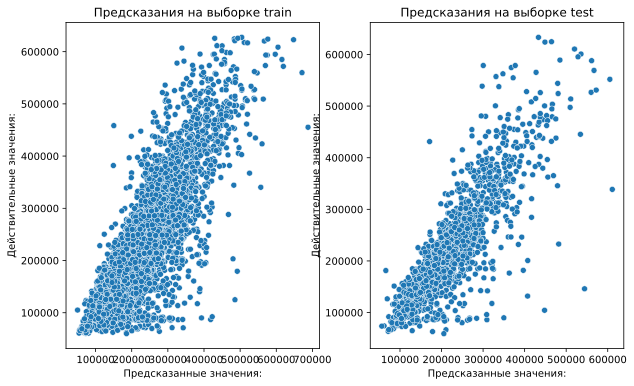

In [61]:
x, y = get_x_y(fd)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 21)

line_regression_model = LinearRegression(copy_X=True)
line_regression_model.fit(x_train, y_train)
train_pred = line_regression_model.predict(x_train)
test_pred = line_regression_model.predict(x_test)

evaluate_preds_2(y_train, train_pred, y_test, test_pred)

models['Linear Regression'] = line_regression_model

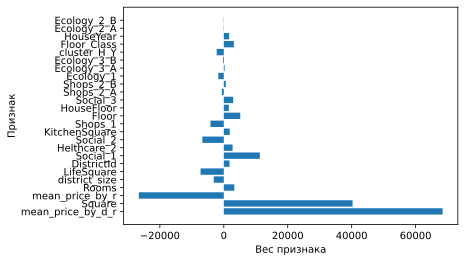

In [62]:
scaler = StandardScaler()
lr = LinearRegression()

features = list(x.columns)
x_train_scaled = scaler.fit_transform(x_train)
x_train_scaled = pd.DataFrame(x_train_scaled, columns=features)

x_test_scaled = scaler.fit_transform(x_test)
x_test_scaled = pd.DataFrame(x_test_scaled, columns=features)

lr.fit(x_train_scaled, y_train)

plt.barh(features, lr.coef_.flatten())

plt.xlabel("Вес признака")
plt.ylabel("Признак")

plt.show()

In [63]:
bf = list(pd.DataFrame({'Feature': features, 'Weight': abs(lr.coef_).flatten()}).sort_values('Weight', ascending=False)[['Feature']].head(15).loc[:,'Feature'])
bf

['mean_price_by_d_r',
 'Square',
 'mean_price_by_r',
 'Social_1',
 'LifeSquare',
 'Social_2',
 'Floor',
 'Shops_1',
 'Rooms',
 'Floor_Class',
 'district_size',
 'Social_3',
 'Helthcare_2',
 'cluster_H_Y',
 'KitchenSquare']

R2 на выборке train:	0.72
R2 на выборке test:	0.716


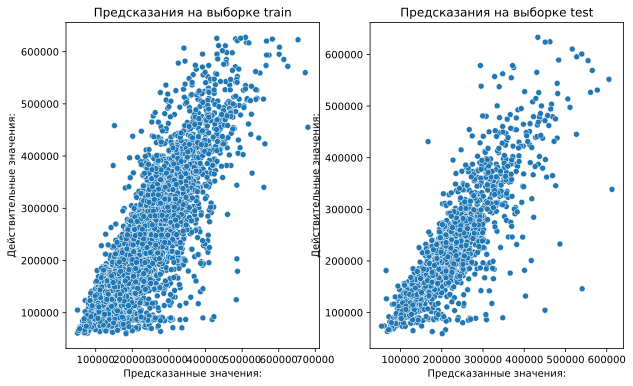

In [64]:
x, y = get_x_y(fd, bf)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 21)

line_regression_model_18_f = LinearRegression(copy_X=True)
line_regression_model_18_f.fit(x_train, y_train)
train_pred = line_regression_model_18_f.predict(x_train)
test_pred = line_regression_model_18_f.predict(x_test)

evaluate_preds_2(y_train, train_pred, y_test, test_pred)

### LassoCV

R2 на выборке train:	0.721
R2 на выборке test:	0.719


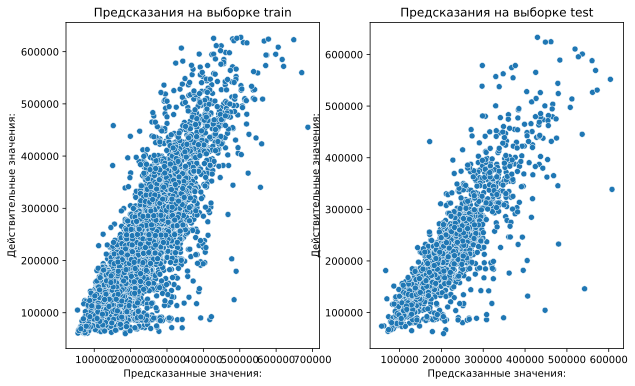

In [65]:
x, y = get_x_y(fd)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 21)

lasso_cv_model = LassoCV(normalize=True, copy_X=True)
lasso_cv_model.fit(x_train, y_train)

train_pred = lasso_cv_model.predict(x_train)
test_pred = lasso_cv_model.predict(x_test)

models['LassoCV'] = lasso_cv_model

# model_test(lasso_cv_model, 'LassoCV', x_test, y_test)
evaluate_preds_2(y_train, train_pred, y_test, test_pred)

### Ridge

R2 на выборке train:	0.721
R2 на выборке test:	0.718


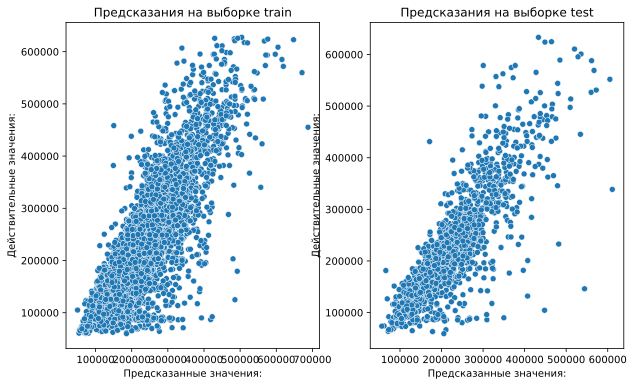

In [66]:
x, y = get_x_y(fd)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 21)

ridge_model = Ridge(copy_X=True)
ridge_model.fit(x_train, y_train)
train_pred = ridge_model.predict(x_train)
test_pred = ridge_model.predict(x_test)

models['Ridge'] = ridge_model
#model_test(lasso_cv_model, 'Ridge', x_test, y_test)
evaluate_preds_2(y_train, train_pred, y_test, test_pred)

### RandomForestRegressor

R2 на выборке train:	0.967
R2 на выборке test:	0.771


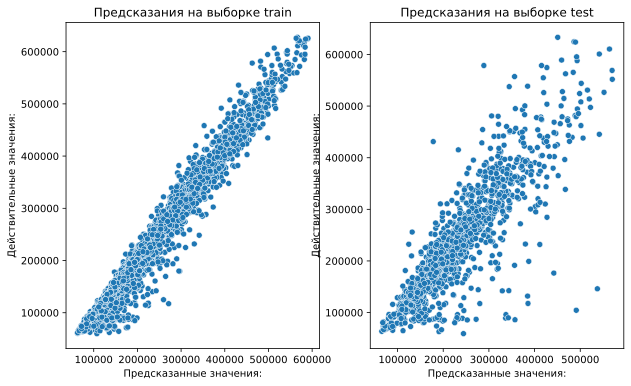

In [67]:
x, y = get_x_y(fd)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 21)

forest = RandomForestRegressor()
forest.fit(x_train, y_train)
train_pred = forest.predict(x_train)
test_pred = forest.predict(x_test)
# model_test(forest, 'Random Forest Regressor', x_test, y_test)
models['Random Forest Regressor'] = forest
evaluate_preds_2(y_train, train_pred, y_test, test_pred)

### Сравнение результатов

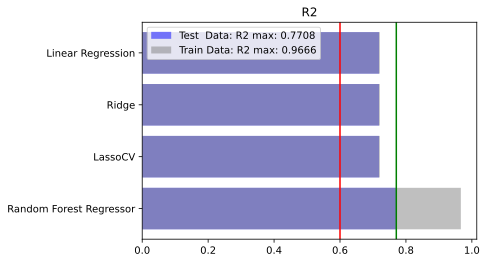

In [68]:
x, y = get_x_y(fd)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 21)

models_r2_test = models_r2(models, x_test, y_test)
models_r2_train = models_r2(models, x_train, y_train)
models_r2_test[['name', 'r2']]

r2_max_test = models_r2_test['r2'].max()
r2_max_train = models_r2_train['r2'].max()

plt.barh(models_r2_test['name'], models_r2_test['r2'],
         alpha=0.5, color='blue', label=f'Test  Data: R2 max: {r2_max_test:.4f}')

plt.barh(models_r2_train['name'], models_r2_train['r2'],
         alpha=0.5, color='grey', label=f'Train Data: R2 max: {r2_max_train:.4f}')

plt.title('R2')
plt.legend()
plt.axvline(0.6, color='red')
plt.axvline(r2_max_test, color='green')
plt.show()

### Итоговое предсказание и запись результата

In [69]:
test = fd.loc[fd['Price'].isna()]

In [70]:
test['Price'] = models['Random Forest Regressor'].predict(test[features])

In [71]:
test[['Id', 'Price']]

,Id,Price
10000,4567,159443.844219
10001,5925,123126.663516
10002,960,137896.673125
10003,3848,142394.213438
10004,746,180948.551172
...,...,...
14995,10379,175797.270234
14996,16138,420387.866094
14997,3912,147977.835625
14998,5722,185131.170859


In [72]:
test[['Id', 'Price']].to_csv('A_Maximov_predictions.csv', index=None)